# Custom hàm xử lý và setting

In [1]:
import cv2
import numpy as np
from joblib import Parallel, delayed
from functools import partial

class PreprocessBatch():
    def __init__(self, height_ratio=0.10, lower_thresh=5, upper_thresh=60, pixel_thresh=0.5,
                 clip_limit=2.0, tile_grid_size=(4, 4), resize_ratio=4, target_size=1824, n_jobs=-1):
        self.height_ratio = height_ratio
        self.lower_thresh = lower_thresh
        self.upper_thresh = upper_thresh
        self.pixel_thresh = pixel_thresh
        self.n_jobs = n_jobs
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size
        self.resize_ratio = resize_ratio
        self.target_size = target_size
        
    def _has_subtitle(self, region):
        h, w = region.shape[:2]
        mask = cv2.inRange(region, np.array(self.lower_thresh), np.array(self.upper_thresh))
        count = cv2.countNonZero(mask)
        num_pixel_thresh = h * w * self.pixel_thresh
        return count > num_pixel_thresh

    def check_image(self, image):
        if len(image.shape) == 2:
            gray = image.copy()
            img_origin = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        elif len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            img_origin = image.copy()
        else:
            raise ValueError("Unsupported image format!")

        gray = cv2.resize(gray, None, fx=self.resize_ratio, fy=self.resize_ratio, interpolation=cv2.INTER_CUBIC)
        img_origin = cv2.resize(img_origin, None, fx=self.resize_ratio, fy=self.resize_ratio, interpolation=cv2.INTER_CUBIC)
        
        return gray, img_origin
        
    def process_one(self, image):
        gray, img_origin = self.check_image(image)
        h, w = gray.shape[:2]
        y_start = int(h * (1 - self.height_ratio))
        y_end = y_start + int(h*0.06)
        subtitle_region = gray[y_start:y_end, :]
        
        # Tăng độ tương phản
        # clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        # lab = cv2.cvtColor(img_origin, cv2.COLOR_RGB2Lab)
        # l, a, b = cv2.split(lab)
        # l_clahe = clahe.apply(l)
        
        blur = cv2.GaussianBlur(img_origin, (5,5), 0)
        # unsharp mask
        sharp = cv2.addWeighted(img_origin, 1.7, blur, -0.7, 0)
        
        # # Kiểm tra vùng phụ đề
        if self._has_subtitle(subtitle_region):
            sharp[y_start:y_end, :] = 0

        if self.target_size < max(h, w):
            ratio = self.target_size / max(h , w)
            new_w, new_h = int(w * ratio), int(h * ratio)
            resized_img = cv2.resize(sharp, (new_w, new_h), interpolation=cv2.INTER_AREA)
            return resized_img, resized_img
        else:
            return sharp, sharp
        # return cv2.cvtColor(enhanced, cv2.COLOR_GRAY2RGB), img_origin
        
    def __call__(self, images):
        if self.n_jobs == 1:
            processed_imgs = [self.process_one(img) for img in images]
        else:
            processed_imgs = Parallel(n_jobs = self.n_jobs)(
                delayed(self.process_one)(img) for img in images
            )
        imgs_to_det = [img[0] for img in processed_imgs]
        imgs_origin = [img[1] for img in processed_imgs]
        return imgs_to_det, imgs_origin

proc_batch = PreprocessBatch()
custom_setting = {
    'link_threshold': 0.7,
    'text_threshold': 0.5,
    'low_text': 0.3,
    'canvas_size': 1824,
    'mag_ratio': 1.
}

# Clone repo và triển khai pipeline

In [2]:
!git clone https://github.com/huutrank4ds/Craft-parseq.git
import sys
sys.path.append('/kaggle/working/Craft-parseq')

Cloning into 'Craft-parseq'...
remote: Enumerating objects: 249, done.
remote: Counting objects: 100% (232/232), done.
remote: Compressing objects: 100% (186/186), done.
remote: Total 249 (delta 105), reused 161 (delta 45), pack-reused 17 (from 2)
Receiving objects: 100% (249/249), 78.48 MiB | 43.87 MiB/s, done.
Resolving deltas: 100% (105/105), done.


In [3]:
from nahocr import NaHOCR
pipe = NaHOCR(device='cuda')

Downloading: "https://github.com/baudm/parseq/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.11/dist-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
Downloading: "https://github.com/baudm/parseq/releases/download/v1.0.0/parseq-bb5792a6.pt" to /root/.cache/torch/hub/checkpoints/parseq-bb5792a6.pt
100%|██████████| 91.0M/91.0M [00:00<00:00, 176MB/s]


# Trực quan kết quả trên các frame

In [4]:
import json
import os
from tqdm import tqdm
import re
import unicodedata

def normalize_text(frame_text):
    """
    Hàm chuẩn hóa văn bản tiếng Việt:
    1. Chuyển thành chữ thường.
    2. Xóa tất cả dấu thanh (diacritics).
    3. Xóa tất cả các ký tự không phải là chữ cái hoặc số.
    
    Args:
        text (str): Chuỗi văn bản đầu vào.
        
    Returns:
        str: Chuỗi văn bản đã được chuẩn hóa.
    """
    # 1. Chuyển thành chữ thường
    text = ' '.join(frame_text)
    text = text.lower()
    
    # 2. Xóa dấu Unicode (diacritics)
    # Sử dụng chuẩn NFD (Normalization Form D) để tách ký tự và dấu
    # Ví dụ: 'á' -> 'a' + '´'
    text = unicodedata.normalize('NFD', text)
    # Chỉ giữ lại các ký tự cơ sở (không phải dấu)
    # 'Mn' là category của các ký tự dấu (Nonspacing Mark)
    text = ''.join([char for char in text if unicodedata.category(char) != 'Mn'])
    
    # Xử lý riêng cho chữ 'đ' vì normalize không xử lý được
    text = text.replace('đ', 'd')
    
    # 3. Xóa tất cả các dấu câu và ký tự đặc biệt
    # Giữ lại chữ cái (a-z), số (0-9) và khoảng trắng (\s)
    # Loại bỏ mọi thứ khác
    text = re.sub(r'[^a-z0-9\s]', '', text)
    
    # (Tùy chọn) Xóa các khoảng trắng thừa
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

In [12]:
from pathlib import Path
import cv2

image_paths = [str(p) for p in Path('/kaggle/input/video-thoi-su').rglob('*.jpg')]
image = [cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB) for path in image_paths]
image_processed = [img for img in proc_batch(image)[0]]
results_det = pipe.ocr(image_paths, custom_process=proc_batch, custom_setting_det=custom_setting)

h tv9 chi nguyen thi thanh thao du khach tinh dong thap giay


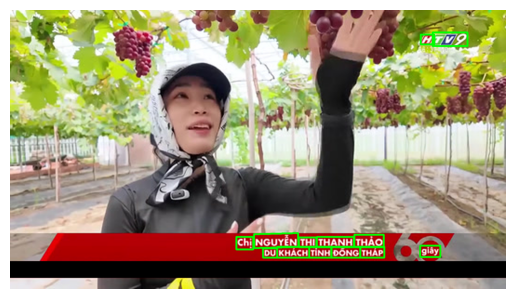

0 andiri m ht vo 065552 mandiri vie 6146 hop sh 455 10


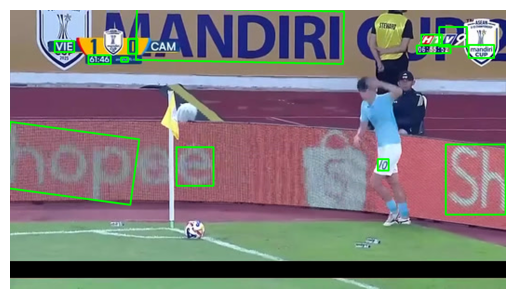

0 mandiri steward h v 06 56 mandi vie mandiri 6144 hop sh s 10


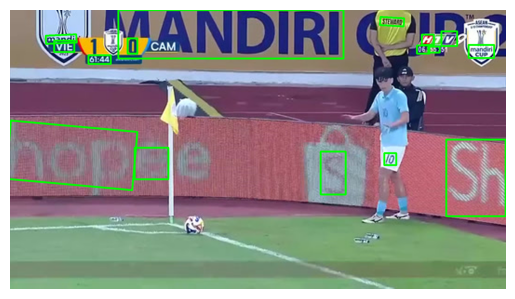

h tv capcou kt6 xe phuc vu hien truong cupcodcoubank 804 chiteprucalmentrudiong


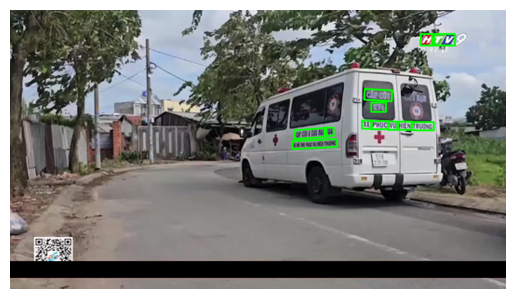

h tv 314


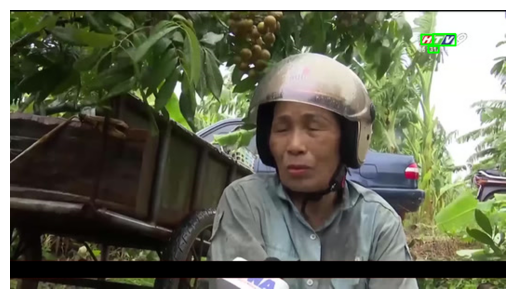

htv9 063707 chi nguyen thi thanh thao du khach tinh dong thap


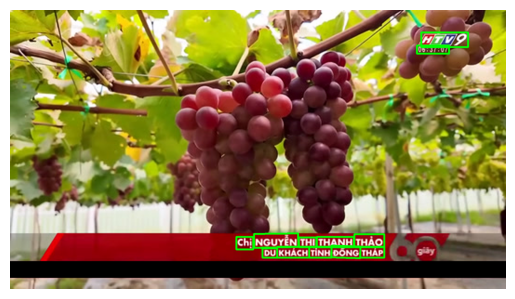

htv9 0 64329 30030 duong cao thicach logioi 15m binh dan hen da duong nguyen th bay lo gioi 12m 00


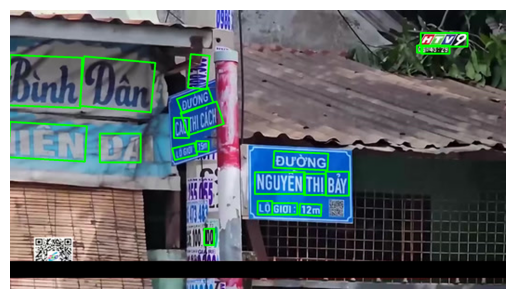

htv9 065303 rick tutt khach tham quan giay


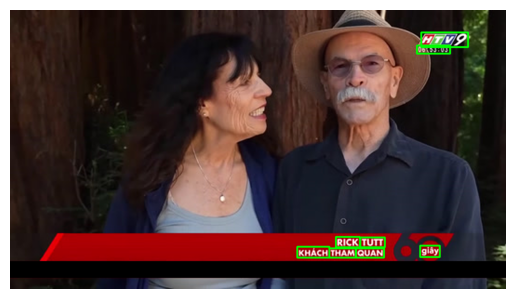

htv9 065238 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


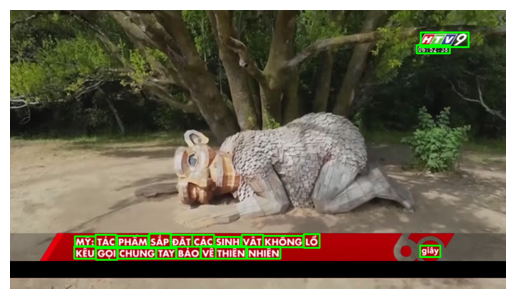

htv9 065206 myrna melgar giam sat vien thanh pho san francisco giay


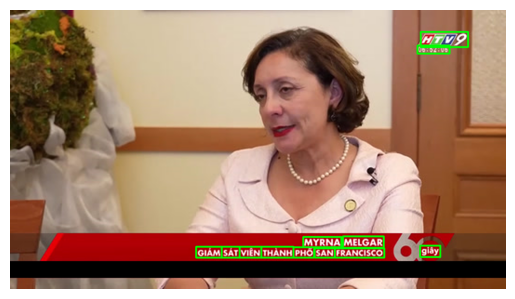

o cam andiri htv 06 55 51 steward man vie mandiri 6144 hopee sh s 10


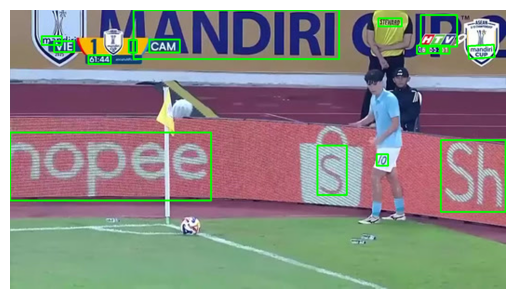

htv9 065156 kunal modi giam doc so y te va an sinh xa hoi san francisco giay


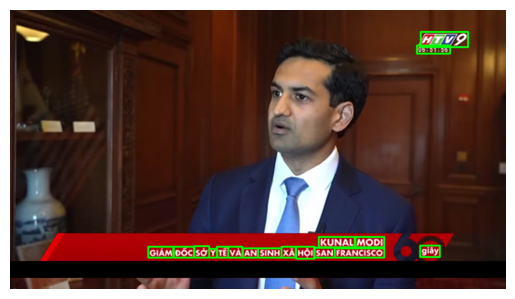

we support htv9 064815 beef managers special 2987 especial del gerente 28 was 2987


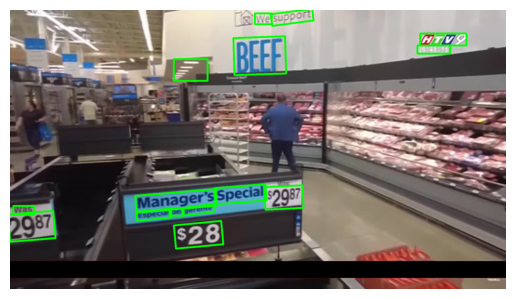

lear 3l49 parks htv9 064829 7 24 id 25 ait 91b and serving size nutrition facts per 4 container calo oz se 112g at


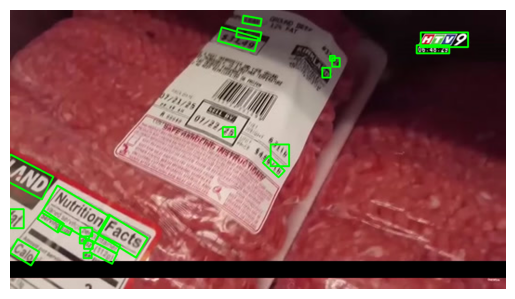

h tv9 065235 m y tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


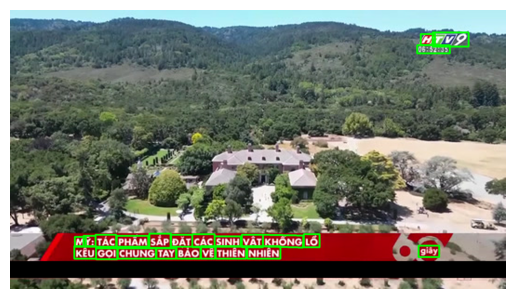

h tv9 065237 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


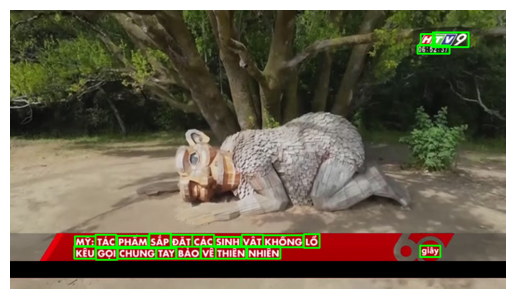

v h g i ba pham thi the xa tan hung tinh hung yen giay


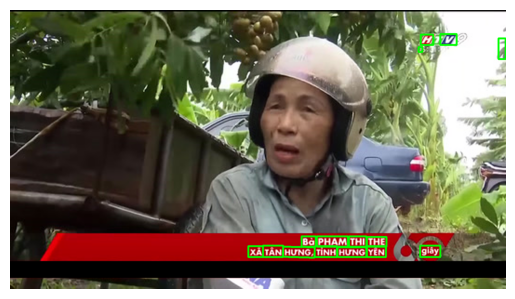

htv9 063205 thanh hoa b nhieu thiet hai do mua bao gay ra giay


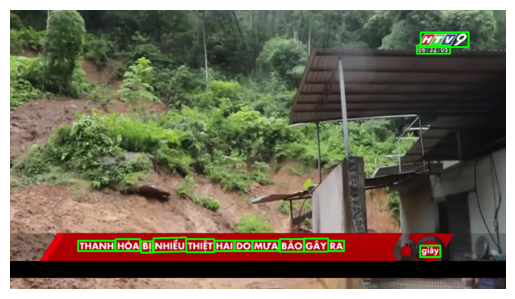

h tv9 065235 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


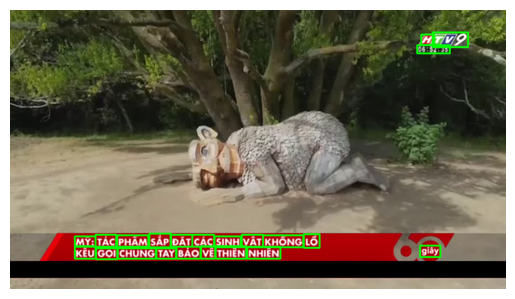

htv9 06 3107 ongti tran van my giam doc htx cay an qua dac quyet thang xa tan hung tinh hung yen giay


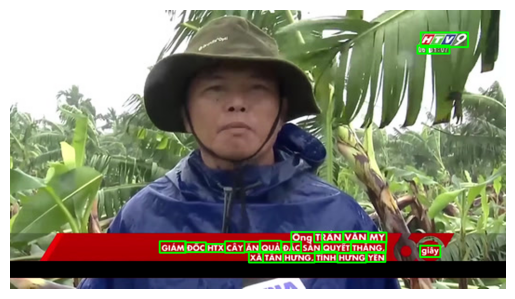

2 htv9 064 497 18 7l f35b cua khong quan anh cat canh sau hon mot thang mac ket q an do giay


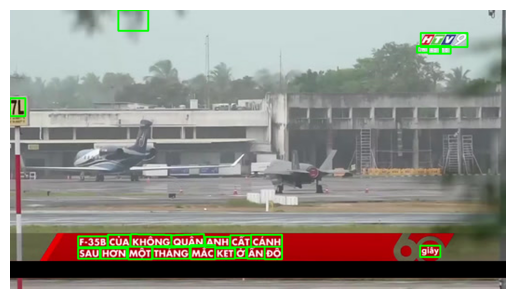

h tv9


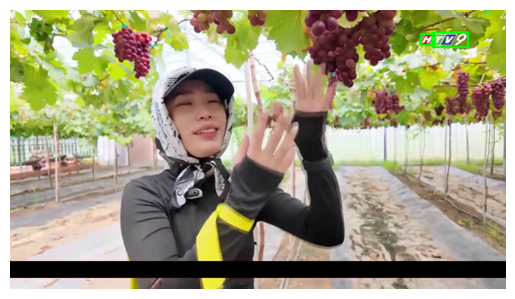

htv9 065237 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


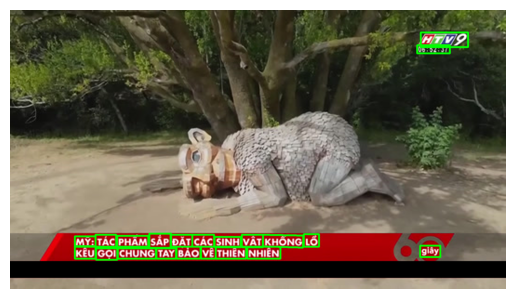

htv9 065155 kunal modi giam doc so y te va an sinh xa hoi san francisco giay


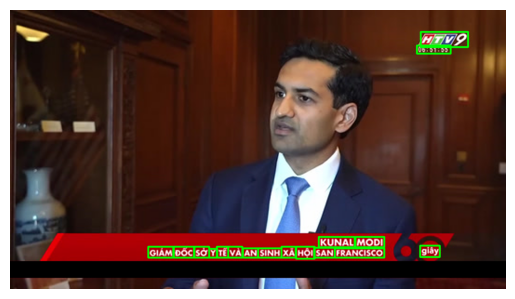

htv9 064237 nha thuoc tay tundan huye n thanh


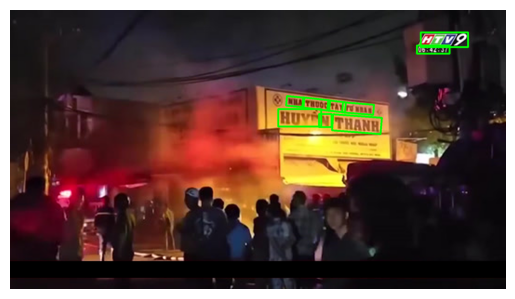

htv9 070137 trung tam tin tuc dai truyen hinh thanh pho ho chi mi


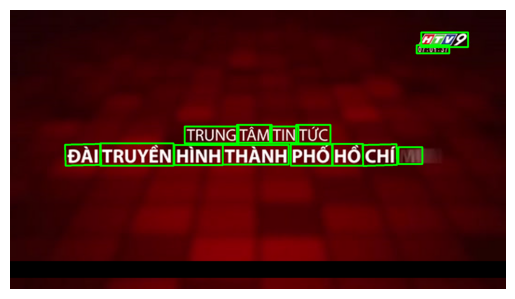

htv9 065258 oma mbo thomas dambo nha dieu khac giay


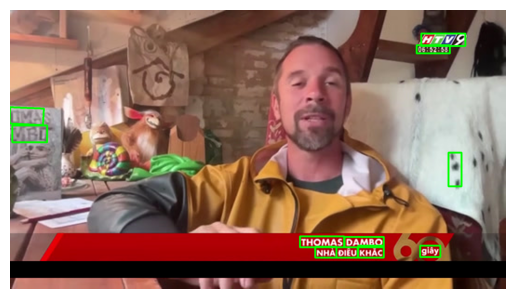

mandiri cup 2025 hyundai 5d hyundai h tv 065549 mandiri hyundai evanch u23 dong nam a viet nam gap campuchia giay


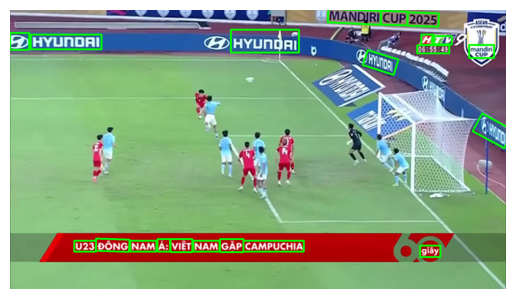

h tv9 063213


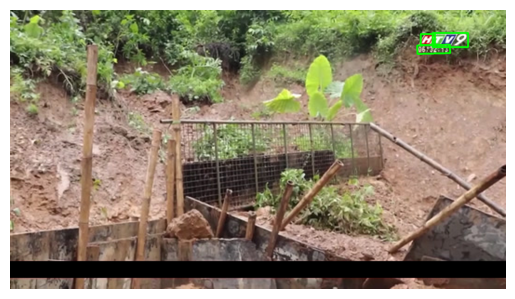

h tv9 063212


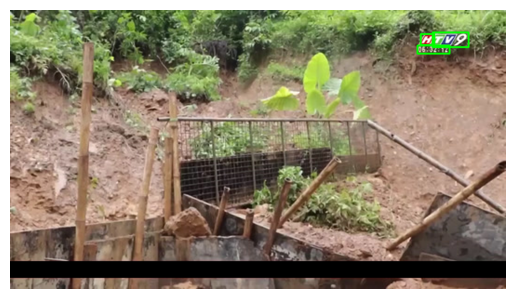

htv9 4408 truc ban hinh su


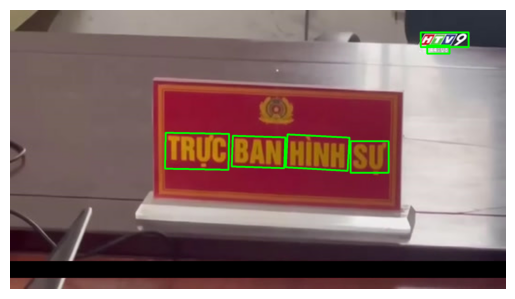

htv9 0652 36 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


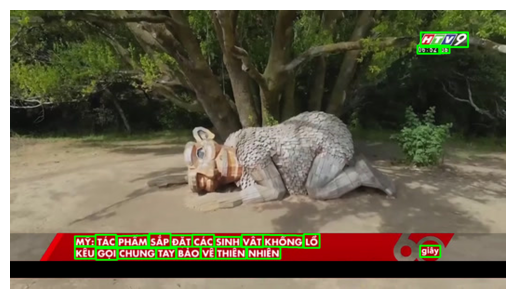

htv nhung vuon nho triu qua q phia nam khanh hoa giay


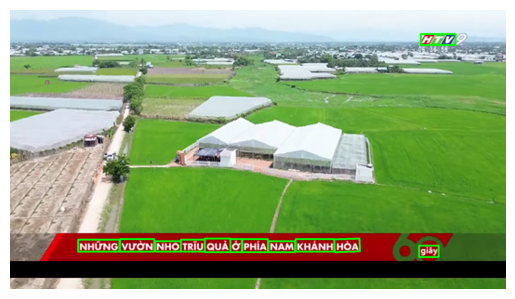

h tv9 063209


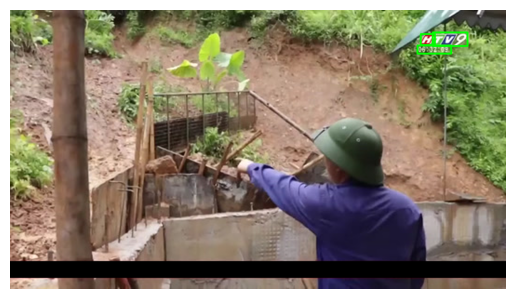

t v tel thien tam hoang


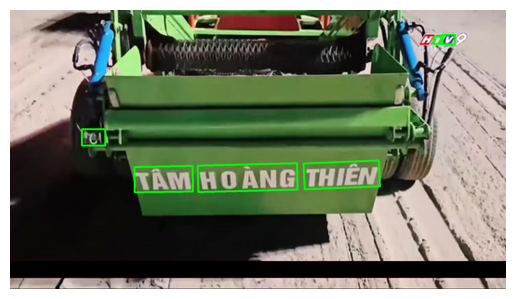

htv9 063208


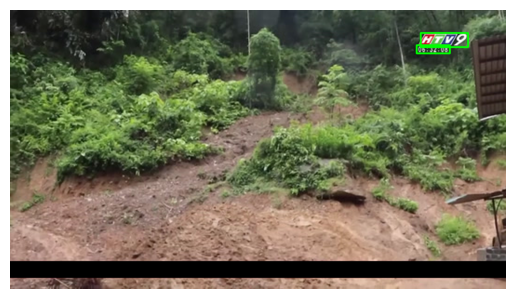

htv9 063206 thanh hoa b nhieu thiet hai do mua bao gay ra giay


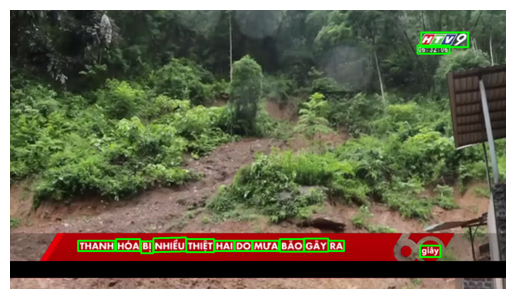

htv9 065238 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


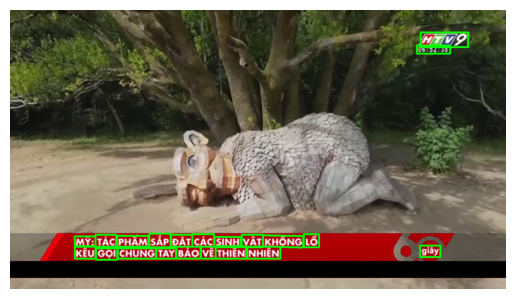

htv9 065236 my tac pham sap dat cac sinh vat khong lo keu goi chung tay bao ve thien nhien giay


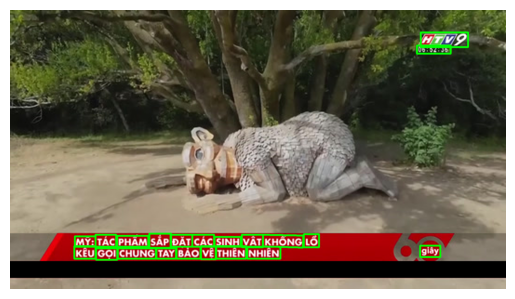

h tv ong nguyen van huynh xa phu hoa 2 dak lak


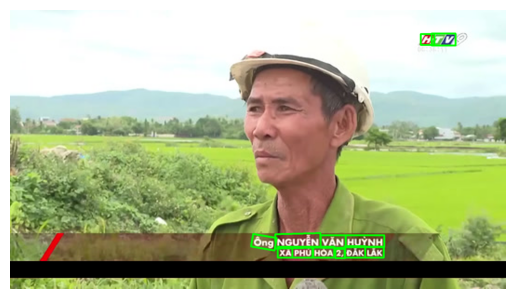

htv9 0 6 10


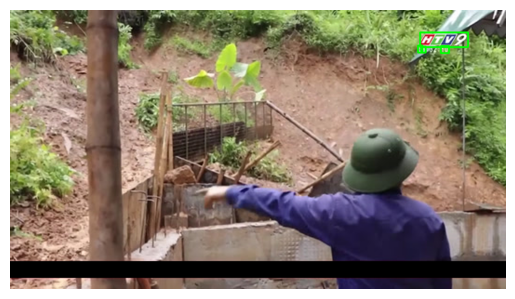

n lean ground rotalprice fat beef 3149 htv9 064830 0 072225 4 11b yions 99lb 25 land serving varked se nutrition gsper facts 4 conta oz as pack 112g 12w at calorie e


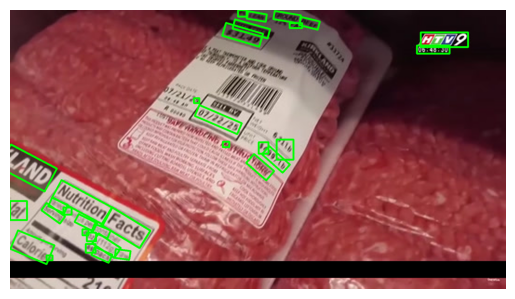

h tv9


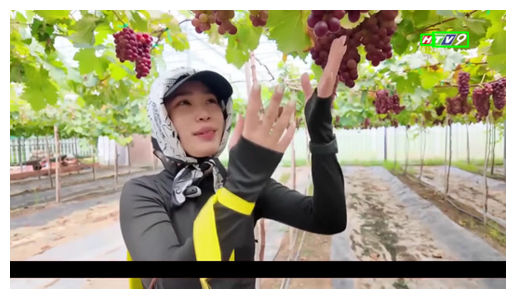

htv ong ta ngoc xuan nhien cong ty tnhh mtv thuy nong dong cam giay


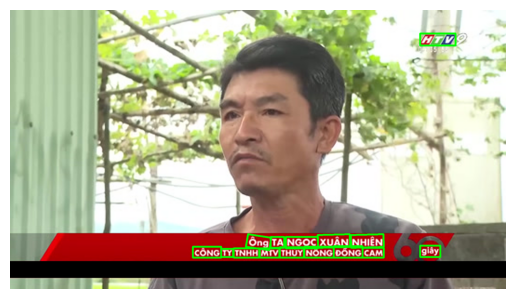

htv9 064236 nha thooc taytunhan huyan thanh


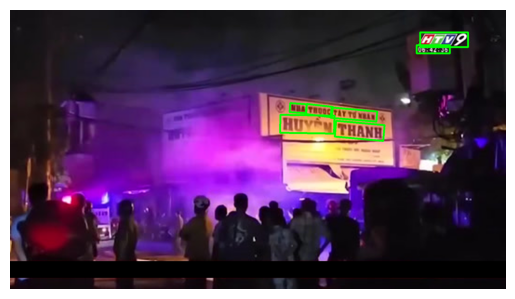

htv tin chinh anh thus nghiem taxi bay giay


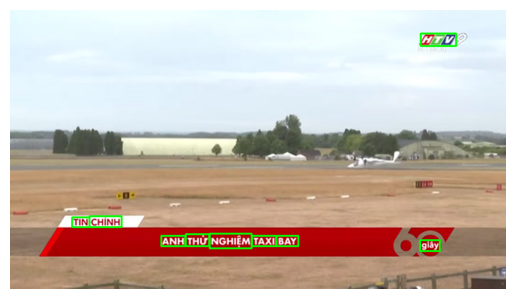

h tv9 063204 thanh hoa b nhieu thiet hai do mua bao gay ra


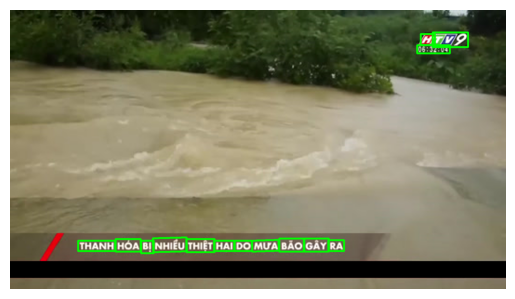

h tv vothi chi vo the chui ovio oooooooooooooooooooooooooo oao vo the ca doc 5 suy than man tinh vi lam dung khang viem


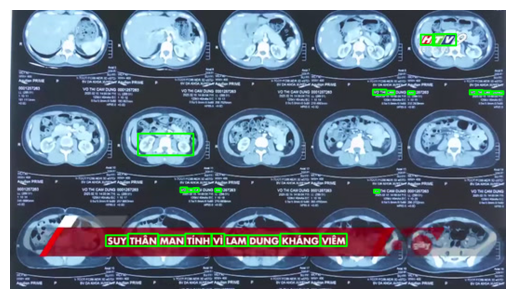

htv9 065207 myrna melgar giam sat vien thanh pho san francisco giay


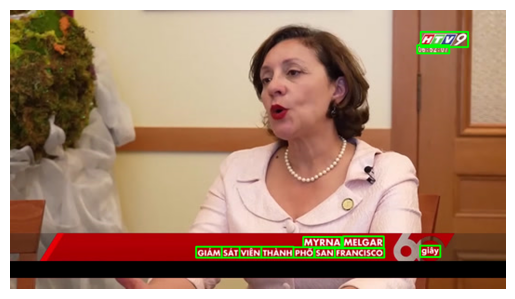

h tv9 0629 58 tin chinh anh huong bao so3 giay


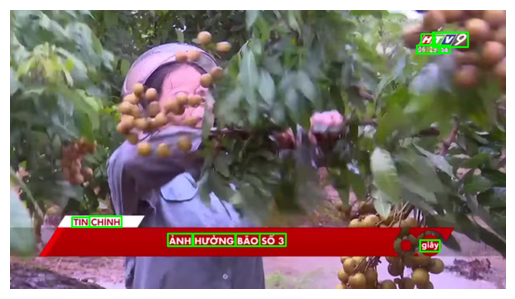

xii we support htv9 06 4816 beef managers s special 2987 especial del gerente gia thit bo my tang 28pluc was 2987


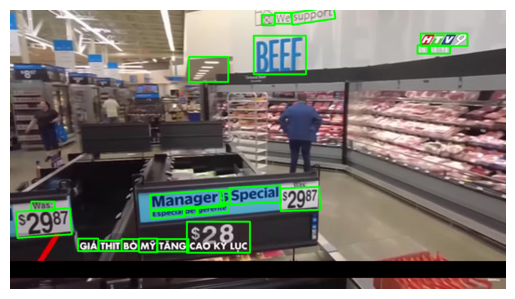

h tv 06 3439 danh bat ca cam dauxe tutap buon duct m moi hinh th die thoai uc phan tron ca h 1028 38444 omoch te la vadev


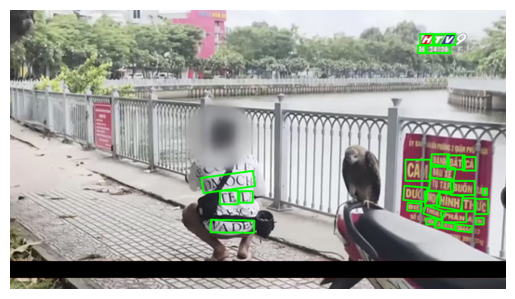

h 9 060136


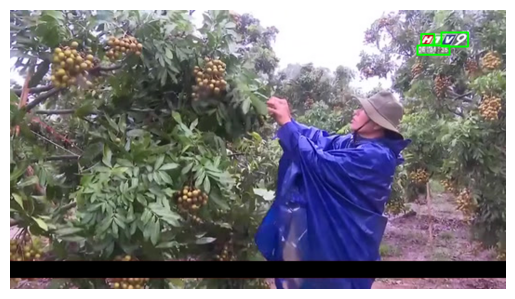

andiri cup 2025 mandiri cup 2025 h v 063015 hyundai hyundai mandiri hyundai 8xhyundai tin chinh giai u23 dong nam a viet nam gap campuchia giay


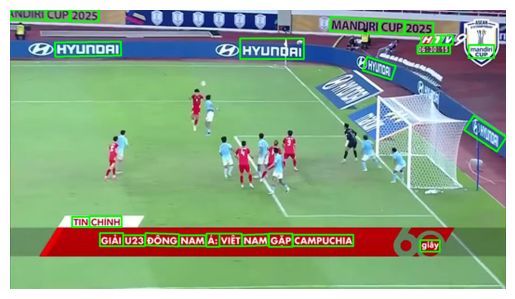

In [18]:
from matplotlib import pyplot as plt
from visualize import draw_polygons

for i in range(len(image_paths)):
    plt.imshow(draw_polygons(image_processed[i], results_det[i]['bboxes'], thickness=5))
    print(normalize_text(results_det[i]['texts']))
    plt.axis('off')
    plt.show()